In [76]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import numpy as np
import sys
sys.path.append("../../")

# Package for importing image representation
from PIL import Image, ImageOps

# My code
from src.compress_sensing_library import *
import pandas as pd
import seaborn as sns
import time
import os.path

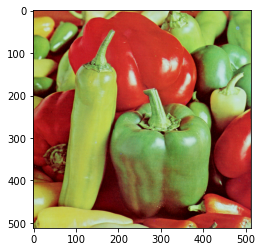

In [77]:
image_nm = 'peppers.png'
img = Image.open('../../image/' + image_nm)
# img = ImageOps.grayscale(img)
img_arr = np.asarray(img)
plt.imshow(img)
orig_dim = img_arr.shape

In [78]:
num_cell_list = [50, 200, 300, 500]
method = 'dct'
lv = 2
# cell_size = 8
# cell_freq = 1
alpha = 1
filt_dim = (30, 30)

In [79]:
# for num_cell in num_cell_list:
num_cell = 200
reconst = filter_reconstruct(img_arr, num_cell, method = method, mode = 'color', observation='gaussian')

Process Reconstruction on (540, 540, 3) image


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 110262.59035927015, tolerance: 70267.4392503816
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23834.606188999638, tolerance: 21292.325086524805
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16646.671047256044, tolerance: 13060.990394861608
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_desce

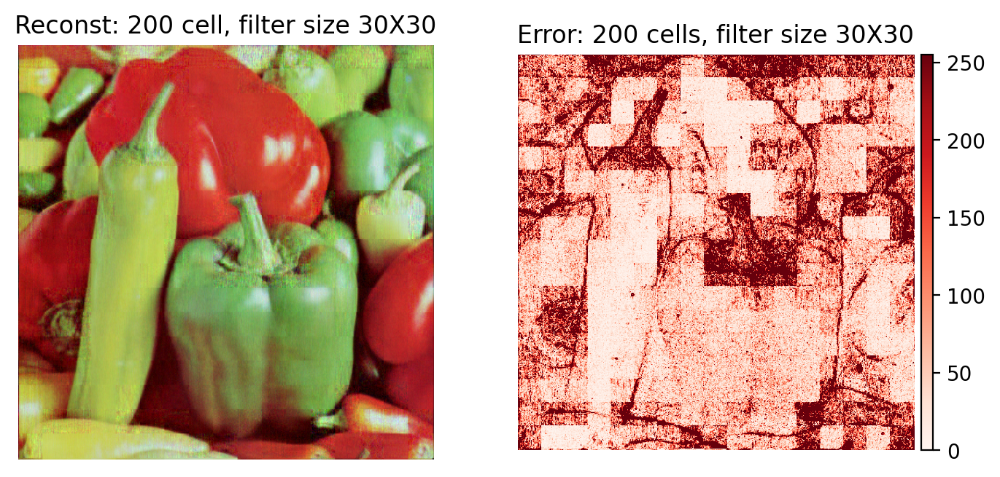

In [97]:


fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (8, 8), dpi=200)
fig.set_figheight(7)
fig.set_figwidth(7)
plt.tight_layout(h_pad=1)

ax1.imshow(reconst, vmin = 0, vmax = 255)
ax1.set_title("Reconst: {num_cell} cell, filter size {f_n}X{f_m}".
              format(num_cell = num_cell, f_n = filt_dim[0], f_m = filt_dim[1]))
ax1.axis('off')

err = ax2.imshow(((img_arr - reconst)**2).mean(axis = 2), 'Reds', vmin = 0, vmax = 255)
ax2.set_title("Error: {num_cell} cells, filter size {f_n}X{f_m}".
              format(num_cell = num_cell, f_n = filt_dim[0], f_m = filt_dim[1]))
ax2.axis('off')

divider2 = make_axes_locatable(ax2)
cax2 = divider2.append_axes("right", size="3%", pad=0.05)
plt.colorbar(err, cax = cax2)
ax2.set_aspect('equal')
# save_path = fig_save_path('peppers', 'dct', 'gaussian/filter_Reconst', "{f_n}X{f_m}_filter_{num_cell}_cell".
#             format(f_n = filt_dim[0], f_m = filt_dim[1], num_cell = num_cell))
# fig.savefig(save_path, dpi = 300,  bbox_inches="tight")
plt.show()

In [75]:
np.random.randint(-255, 255, (100, 100, 3))

array([[[-148, -110,   59],
        [  34, -184,   15],
        [ 128,  204,  -88],
        ...,
        [ 230,    9,   28],
        [ 126,  -84,  -47],
        [ -58,  244,  -99]],

       [[   4, -235, -254],
        [ 182, -149,   68],
        [  20,    9,  154],
        ...,
        [ -18,  111,  -31],
        [-173, -174,  246],
        [-119,  -64,   29]],

       [[-183, -123,  127],
        [ 227, -205,  -85],
        [ 162,   29,  151],
        ...,
        [-124,  -35,  -26],
        [  64,  -78, -113],
        [-208,  183,  -30]],

       ...,

       [[ -87,  -75,  163],
        [ -70,  -18,  -31],
        [-129,  116,   -2],
        ...,
        [-227,  171, -249],
        [ 205,  -17,  -36],
        [ 209, -135,  243]],

       [[ 110, -240,  190],
        [-245,  -90, -230],
        [-120, -178,  222],
        ...,
        [ 139,  174,  -96],
        [-137, -157,   89],
        [  91,  -32,   27]],

       [[ -35, -157,  -90],
        [  63,  171, -212],
        [  18,  

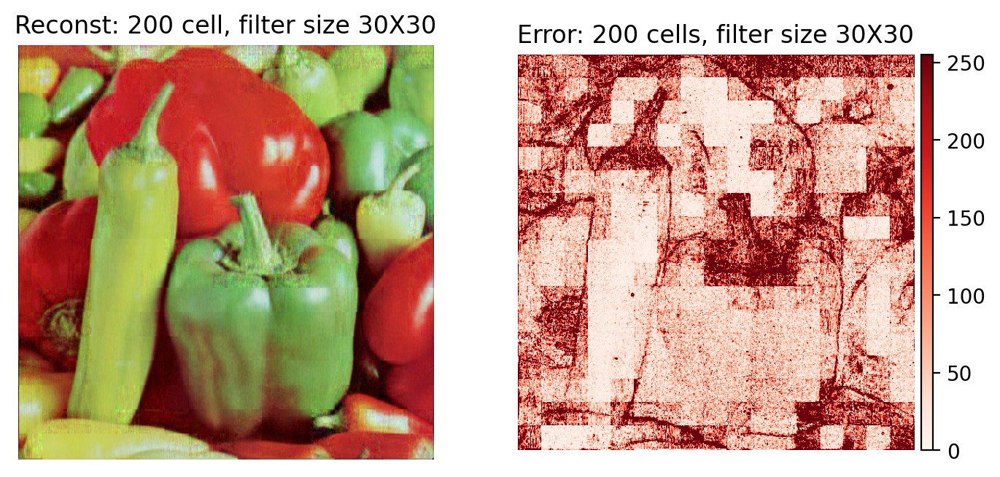

In [73]:
#Mock file for Angus

fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (8, 8), dpi=200)
fig.set_figheight(7)
fig.set_figwidth(7)
plt.tight_layout(h_pad=1)

img_arr = np.random.randint((100, 100, 3))

ax1.imshow(reconst, vmin = 0, vmax = 255)
ax1.set_title("Reconst: {num_cell} cell, filter size {f_n}X{f_m}".
              format(num_cell = num_cell, f_n = filt_dim[0], f_m = filt_dim[1]))
ax1.axis('off')

err = ax2.imshow(((img_arr - reconst)**2).mean(axis = 2), 'Reds', vmin = 0, vmax = 255)
ax2.set_title("Error: {num_cell} cells, filter size {f_n}X{f_m}".
              format(num_cell = num_cell, f_n = filt_dim[0], f_m = filt_dim[1]))
ax2.axis('off')

divider2 = make_axes_locatable(ax2)
cax2 = divider2.append_axes("right", size="3%", pad=0.05)
plt.colorbar(err, cax = cax2)
ax2.set_aspect('equal')
# save_path = fig_save_path('peppers', 'dct', 'gaussian/filter_Reconst', "{f_n}X{f_m}_filter_{num_cell}_cell".
#             format(f_n = filt_dim[0], f_m = filt_dim[1], num_cell = num_cell))
# fig.savefig(save_path, dpi = 300,  bbox_inches="tight")
plt.show()

In [ ]:
# squared error si
nce rgb would not be encoded into one color channel
((img_arr - reconst)**2).mean(axis = 2)

In [9]:
img_arr - reconst

array([[[ 100,    0, -106],
        [ -38,  -17,    0],
        [   0,  -78,    7],
        ...,
        [   0, -185,   49],
        [   1,    0,    1],
        [   0,   -1,   70]],

       [[  90,    0,  -16],
        [   0,   56,   -7],
        [  36,  -17,  -14],
        ...,
        [ -19,    0,   -9],
        [ -36,  134,    0],
        [   5,  127,    0]],

       [[  58,    0,   -9],
        [   0,   39,    3],
        [  34,   -9,    0],
        ...,
        [ -19,   -3,    0],
        [ -16,  101,   10],
        [   0,   89,    0]],

       ...,

       [[   0,    0,    0],
        [ -26,    0,    0],
        [   0,    0,   20],
        ...,
        [   0,    0,   41],
        [   6,    0,   11],
        [   0,    0,  -38]],

       [[   0,  -97,    0],
        [  34,    9,    0],
        [   0,   -6,   13],
        ...,
        [   0,   33,    0],
        [   0,  189,  170],
        [  65,  156,  117]],

       [[   0,   -1,  -32],
        [ -14,    0,    0],
        [   9,  

/tmp/ipykernel_27112/4219349094.py:15: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


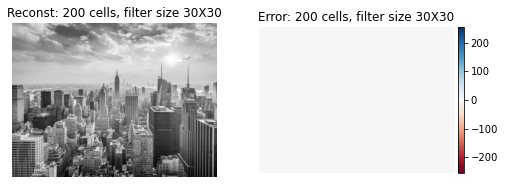

In [55]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (7, 7))
plt.tight_layout()
ax1.imshow(reconst, 'gray', vmin = 0, vmax = 255)
ax1.set_title("Reconst: 200 cells, filter size 30X30")
ax1.axis('off')
err = ax2.imshow(img_arr - reconst, 'RdBu', vmin = 0, vmax = 255)
ax2.set_title("Error: 200 cells, filter size 30X30")
ax2.axis('off')
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="3%", pad=0.05)
fig.colorbar(err, cax = cax)
ax2.set_aspect('equal')
fig.savefig("result/filter_reconstruction/city/{f_n}X{f_m}_filter_{num_cell}_cell.png".
            format(f_n = filt_dim[0], f_m = filt_dim[1], num_cell = num_cell), dpi = 300,  bbox_inches="tight")
fig.show()

(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430


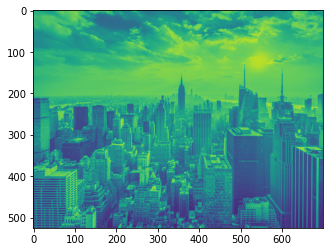

In [37]:
plt.imshow(filter_reconstruction(200, img_arr, 7, 2))

In [38]:
low_cell_res = filter_reconstruction(50, img_arr, 7, 2)
mid_cell_res = filter_reconstruction(200, img_arr, 7, 2)
high_cell_res = filter_reconstruction(500, img_arr, 7, 2)

(540, 720)
iteration 86
iteration 172


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 335842.9474264125, tolerance: 314068.39593749837
  model = cd_fast.enet_coordinate_descent(


iteration 258


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 402349.67846498196, tolerance: 381710.00572569034
  model = cd_fast.enet_coordinate_descent(


iteration 344


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 124797.67946482291, tolerance: 123193.49427940717
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114624.4222426736, tolerance: 45235.458538174855
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 140425.73713387962, tolerance: 123788.92519355656
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_desc

iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430


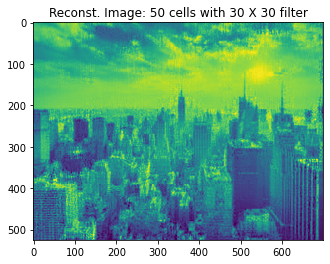

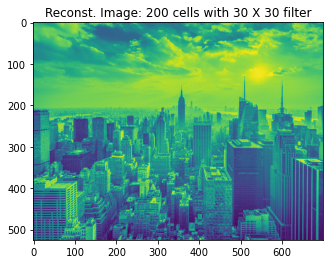

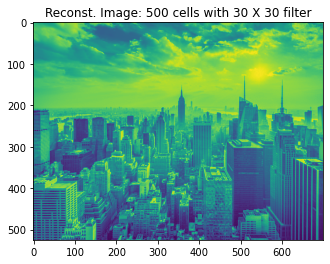

In [39]:
plt.imshow(low_cell_res, vmin = 0, vmax = 256)
plt.title('Reconst. Image: 50 cells with 30 X 30 filter')
plt.show()

plt.imshow(mid_cell_res, vmin = 0, vmax = 256)
plt.title('Reconst. Image: 200 cells with 30 X 30 filter')
plt.show()

plt.imshow(high_cell_res, vmin = 0, vmax = 256)
plt.title('Reconst. Image: 500 cells with 30 X 30 filter')
plt.show()

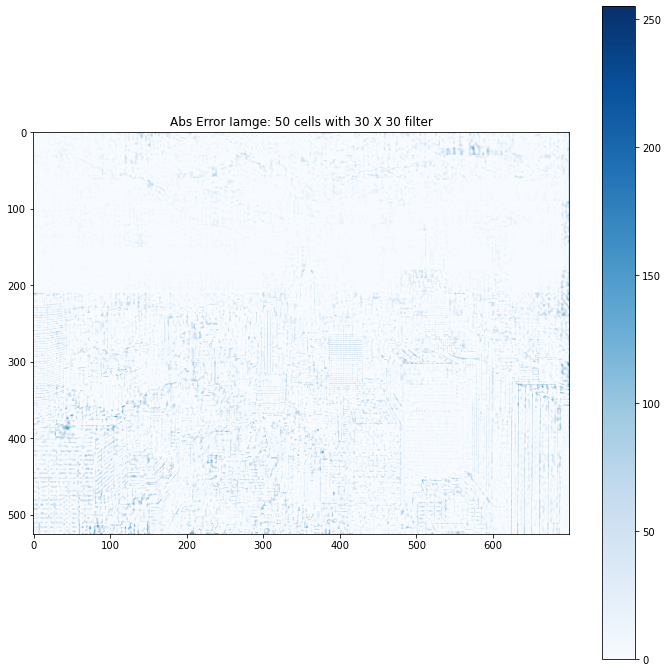

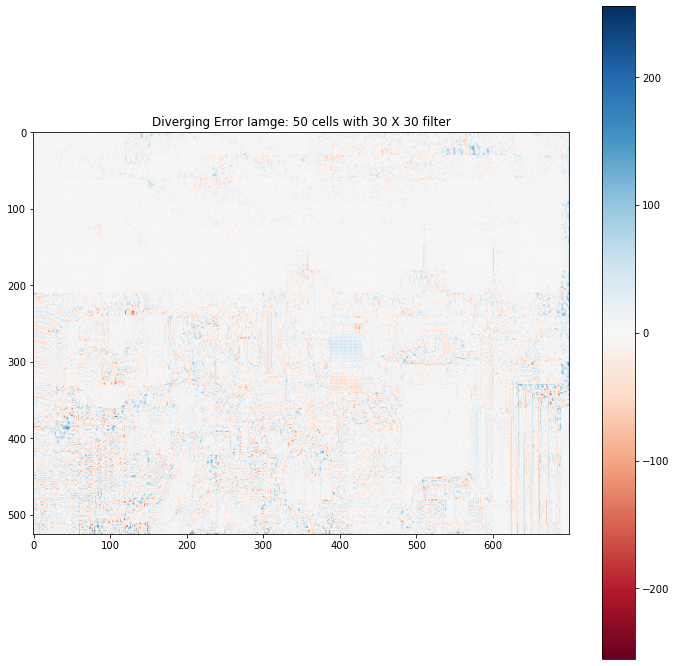

In [40]:
n,m = img_arr.shape
plt.figure(figsize=(12, 12))
ax = plt.imshow(np.abs(img_arr - low_cell_res), vmin=0, vmax=255, cmap = 'Blues')
plt.colorbar(ax)
plt.title('Abs Error Iamge: 50 cells with 30 X 30 filter')
np.linalg.norm(img - high_cell_res, 'fro') / np.sqrt(m*n)
plt.show()

n,m = img_arr.shape
plt.figure(figsize=(12, 12))
ax = plt.imshow(img_arr - low_cell_res, vmin=-255, vmax=255, cmap='RdBu')
plt.colorbar(ax)
plt.clim((-255, 255))
plt.title('Diverging Error Iamge: 50 cells with 30 X 30 filter')
np.linalg.norm(img - high_cell_res, 'fro') / np.sqrt(m*n)
plt.show()

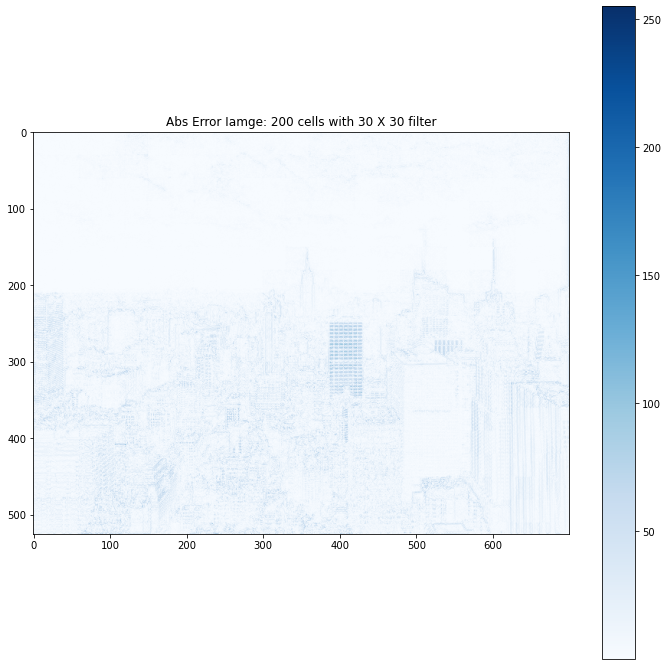

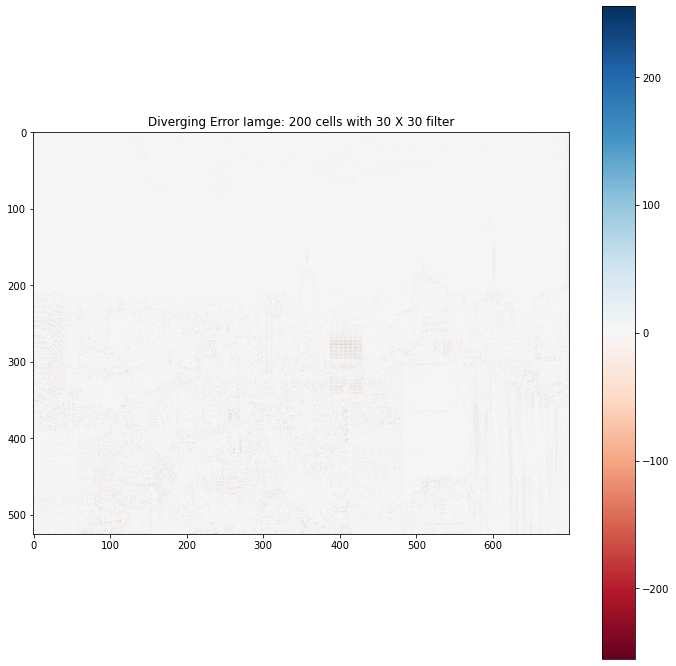

In [41]:
n,m = img_arr.shape
plt.figure(figsize=(12, 12))
aexperimentmethod_figuresx = plt.imshow(np.abs(img_arr - mid_cell_res), vmax=255, cmap = 'Blues')
plt.title('Abs Error Iamge: 200 cells with 30 X 30 filter')
plt.colorbar(ax)
np.linalg.norm(img - high_cell_res, 'fro') / np.sqrt(m*n)
plt.show()

n,m = img_arr.shape
plt.figure(figsize=(12, 12))
ax = plt.imshow(img_arr - mid_cell_res, vmin=-255, vmax=255, cmap='RdBu')
plt.colorbar(ax)
plt.title('Diverging Error Iamge: 200 cells with 30 X 30 filter')
np.linalg.norm(img - mid_cell_res, 'fro') / np.sqrt(m*n)

plt.show()

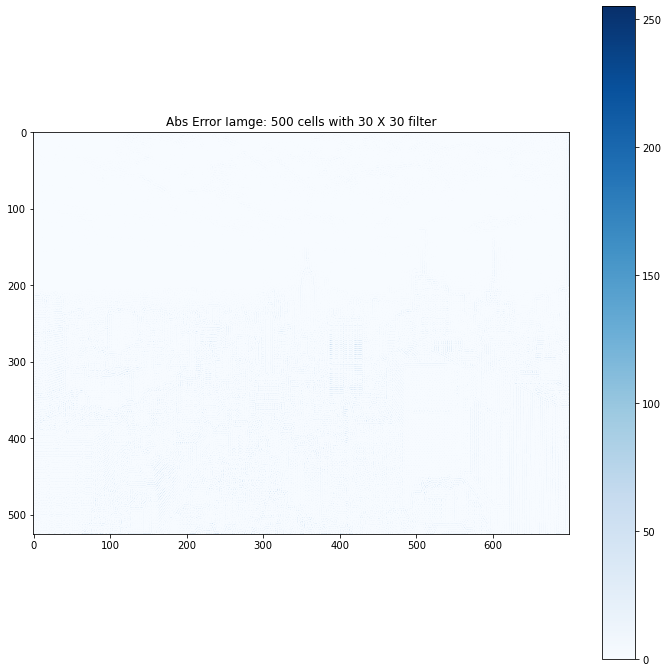

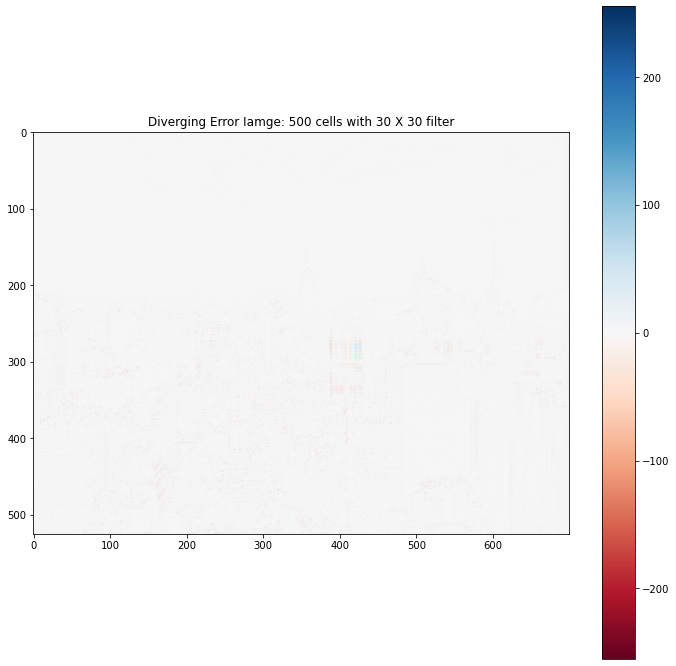

In [42]:
n,m = img_arr.shape
plt.figure(figsize=(12, 12))
ax = plt.imshow(img_arr - high_cell_res, vmin=0, vmax=255, cmap = 'Blues')
plt.colorbar(ax)
plt.title('Abs Error Iamge: 500 cells with 30 X 30 filter')
np.linalg.norm(img - high_cell_res, 'fro') / np.sqrt(m*n)
plt.show()


n,m = img_arr.shape
plt.figure(figsize=(12, 12))
ax = plt.imshow(img_arr - high_cell_res, vmin=-255, vmax=255, cmap='RdBu')
plt.colorbar(ax)
plt.title('Diverging Error Iamge: 500 cells with 30 X 30 filter')
np.linalg.norm(img - high_cell_res, 'fro') / np.sqrt(m*n)
plt.show()

(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430


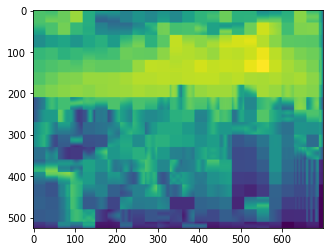

In [43]:
temp = filter_reconstruction(num_cell =200, img_arr = img_arr, sparse_freq = 2, cell_size = 7, alpha = 5000)

plt.imshow(temp)

(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50261.07100457305, tolerance: 45738.24377898279
  model = cd_fast.enet_coordinate_descent(


iteration 430


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1644.781381285398, tolerance: 1106.3120080350645
  model = cd_fast.enet_coordinate_descent(


(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 115987.9261824459, tolerance: 98640.05634525842
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 98115.22830727724, tolerance: 70096.40382309296
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 353748.18475632666, tolerance: 242429.85462529107
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent

iteration 430


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 75886.74203556469, tolerance: 50583.13278285478
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 180230.8675422921, tolerance: 179329.3567833061
  model = cd_fast.enet_coordinate_descent(


(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 224607.69289972575, tolerance: 203835.590005991
  model = cd_fast.enet_coordinate_descent(


iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 76757.22352853988, tolerance: 39648.61284742358
  model = cd_fast.enet_coordinate_descent(


iteration 344


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 408760.62037409475, tolerance: 403870.34911799367
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 256093.7761674121, tolerance: 84715.82619736537
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 93099.72806122675, tolerance: 66439.65408100732
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent

iteration 430


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 84604.18501240187, tolerance: 44560.726719885126
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 229061.3280460443, tolerance: 92977.4529007192
  model = cd_fast.enet_coordinate_descent(


(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 175000.01581128407, tolerance: 118369.66881552592
  model = cd_fast.enet_coordinate_descent(


iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
it

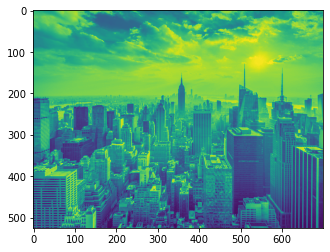

In [49]:
#import image information
image_nm = 'city.png'
img = Image.open('image/' + image_nm)
img = ImageOps.grayscale(img)
img_arr = np.asarray(img)
plt.imshow(img)
dim = img_arr.shape

# res1 for fixed alpha value and res2 for storing alpha value depending on number of cell
res1 = []
res2 = []
param_list = []
# num_cell = 100
sparse_freq = 2
cell_size = 7
num_cell_list = [50, 100, 300, 500]

for num_cell in num_cell_list:
    alpha_list = np.logspace(-3, 4, 8) * 50 / num_cell
    for alpha in  alpha_list:
        param_list.append((num_cell, alpha))
        res1.append(filter_reconstruction(num_cell = num_cell, img_arr = img_arr, 
                                          sparse_freq = sparse_freq, cell_size = cell_size, alpha = alpha))
    res2.append(filter_reconstruction(num_cell = num_cell, img_arr = img_arr, 
                                      sparse_freq = sparse_freq, cell_size = cell_size))

In [50]:
# path to save image array into image
save_path = os.path.join('./result/auto_alpha_comparison/')

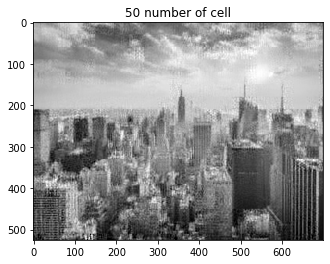

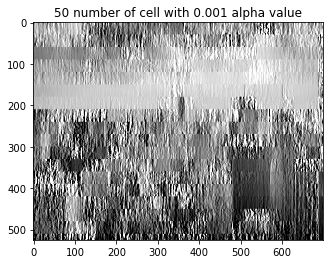

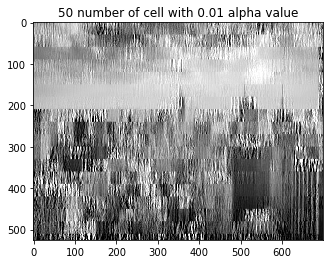

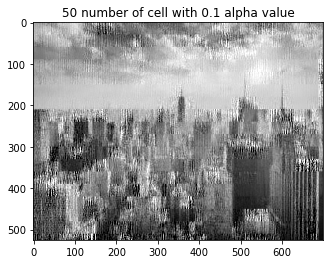

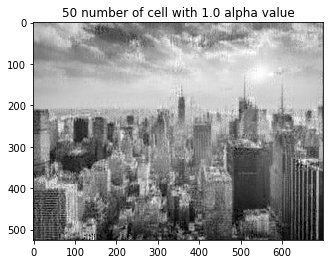

...

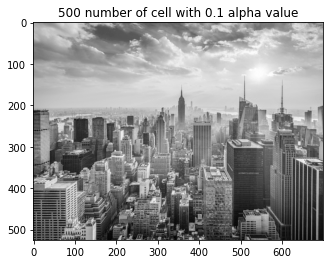

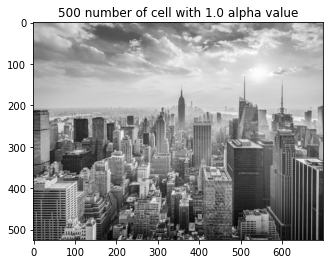

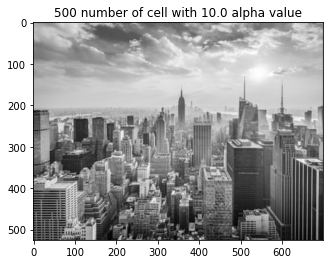

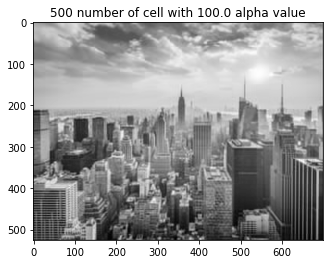

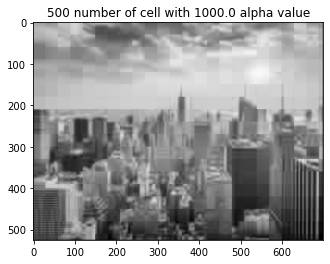

In [51]:
cell = 0

for i, r2 in enumerate(res1):
    if (param_list[i][0] != cell):
        r1 = res2[i % len(res2)]
        cell = param_list[i][0]
        title1 = "{num_cell} number of cell".format(num_cell = cell)
        np.save(save_path + (title1.replace(" ", "_")) + ".npy", r1)
        plt.imshow(r1, cmap = 'gray', vmin=0, vmax=255)
        plt.title(title1)
        plt.savefig(save_path + (title1.replace(" ", "_")) + "_scaled.png", dpi=200)
        plt.show()
                
    title2 = "{num_cell} number of cell with {alpha} alpha value".format(
        num_cell = param_list[i][0], alpha = param_list[i][1])
    np.save(save_path + (title2.replace(" ", "_")) + ".npy", r2)
    plt.imshow(r2, cmap = 'gray', vmin=0, vmax=255)
    plt.title(title2) 
    plt.savefig(save_path + (title2.replace(" ", "_")) + "_scaled.png", dpi=200)
    plt.show()
    
